### Import

In [1]:
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import glob
from sklearn.linear_model import LinearRegression
%matplotlib inline

### Detect Color Pallete

In [63]:
def find_color_pallete(img):
    grey = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    thresh, bw = cv2.threshold(grey,0,1,cv2.THRESH_BINARY | cv2.THRESH_OTSU)
    bw = cv2.erode(bw,kernel=(3,3))
    im2, contours, hierarchy = cv2.findContours(bw, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours,key=cv2.contourArea,reverse=True)
    rect = cv2.boundingRect(contours[2])
    
    return rect, contours

### Make training data for rgb gold vals

In [64]:
def create_gold_vals(cropped, img, file_path):
    
    if cropped.shape[0]>cropped.shape[1]:
#         img = 
        cropped = cropped.transpose([1,0,2])
        cv2.imwrite(file_path, img.transpose([1,0,2]))
    x = int(.20*cropped.shape[0])
    y = int(.15*cropped.shape[1])
    print(cropped[x, y])
    if cropped[x,y][0]>125: 
        cropped = np.array(list(map(lambda x: x[::-1], cropped)))
#     cropped = file_path
#     plt.imshow(cropped)
#     plt.show()
    rgb_vals = []
    
        
    cropped1 = cropped.copy()
    for j in list(range(int(.20*cropped1.shape[0]),cropped1.shape[0],int(.22*cropped1.shape[0]))):
        for i in list(range(int(.15*cropped1.shape[1]),cropped1.shape[1]-int(.15*cropped1.shape[1]),int(.135*cropped1.shape[1]))):
            cv2.rectangle(cropped1,(i,j),(i+5,j+5),(255,125,255),3)
#             
            rgb_val = list(cropped[j, i]) + [(cropped[j, i][0])**2, cropped[j, i][1]**2, cropped[j, i][2]**2, 
                                             (cropped[j, i][0])**3, cropped[j, i][1]**3, cropped[j, i][2]**3,
                                            (cropped[j, i][0])*cropped[j, i][1], cropped[j, i][1]*cropped[j, i][2],
                                             cropped[j, i][2]*cropped[j, i][0]]
            rgb_vals.append(rgb_val)
    return rgb_vals, cropped1

### Change the STD values in the cell below 

In [77]:
def find_disease_severity_level(img, contour, file_path):
#     hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    hsv=img
    b,g,r = cv2.split(img)
    
    g_mean = np.mean(g)
    b_mean = np.mean(b)
    r_mean = np.mean(r)
    
    g_std = np.std(g)
    b_std = np.std(b)
    r_std = np.std(r)
    
    rect = cv2.boundingRect(contour)
    x,y,w,h = rect
    hsv = hsv[y:y+h,x:x+w]
    
#     Change these Std Values 
    r_std_range = 2*r_std
    b_std_range = 2*b_std
    g_std_range = 2*g_std
    bw = np.zeros((hsv.shape[0],hsv.shape[1]))
    for i, row in enumerate(hsv):
        for j, val in enumerate(row):
            if b_mean-b_std_range<hsv[i,j][0]<b_mean+b_std_range and g_mean-g_std_range<hsv[i,j][1]<g_mean+g_std_range \
            and r_mean-r_std_range<hsv[i,j][2]<r_mean+r_std_range:
                bw[i,j] = 0
            else:
                bw[i,j] = 1
    print(bw)
    plt.imshow(img[y:y+h,x:x+w])
    plt.show()
    plt.imshow(bw)
    plt.show()
    cv2.imwrite("./threshold/"+file_path.split("/")[-1], bw*255)

In [78]:
def get_image_rgb_values(file_path):
    img = cv2.imread(file_path)
    rect, contours = find_color_pallete(img)
    x,y,w,h = rect
    cropped = img[y:y+h,x:x+w]
    
#     preform perspective transform
    rect = cv2.minAreaRect(contours[2])
    box = cv2.boxPoints(rect) 
    box = np.int0(box)
    src_pts = [[x+w,y+h],[x,y+h],[x,y],[x+w,y]]
    rows,cols,ch = cropped.shape
    pts1 = np.float32(src_pts)
    pts2 = np.float32(box)
    pts2 = pts2[[np.argmin(abs((pts2[:,0]-pts[0]))+abs((pts2[:,1]-pts[1]))) for pts in pts1]]
    M = cv2.getPerspectiveTransform(pts2,pts1)
    dst = cv2.warpPerspective(img,M,(img.shape[1], img.shape[0]))
    
#     Find the 
    rect, contours = find_color_pallete(dst)
    x,y,w,h = rect
    cropped = dst[y:y+h,x:x+w]
    
#     plt.imshow(cropped)
#     plt.show()
#     print(cropped.shape)
    find_disease_severity_level(img, contours[1], file_path)
    rgb_vals, cropped1 = create_gold_vals(cropped, img, file_path=file_path)
    plt.imshow(cropped1)
    plt.show()
    
    return rgb_vals 

### Extract rgb values for all files

In [79]:
all_files = glob.glob("./corbana/*.jpg")

./corbana/Photo Aug 29, 10 15 20 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


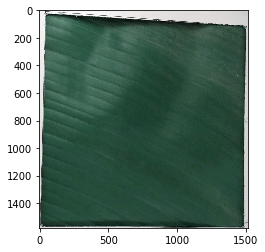

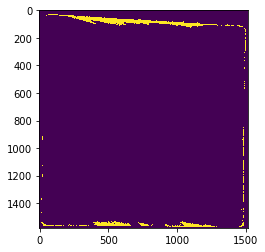

[19 15 14]


/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:25: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:26: RuntimeWarning: overflow encountered in ubyte_scalars


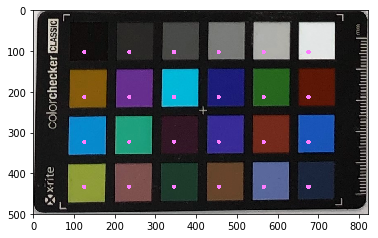

./corbana/Photo Aug 29, 10 15 28 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


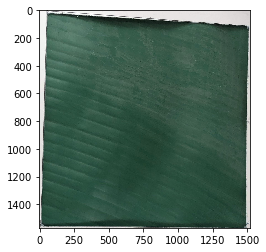

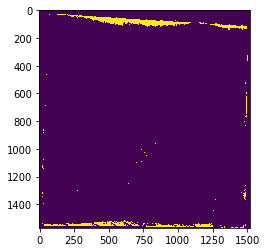

[19 17 16]


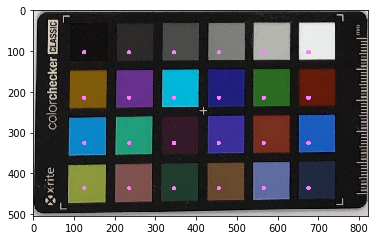

./corbana/Photo Aug 29, 10 15 56 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


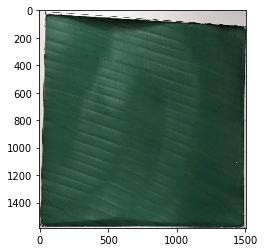

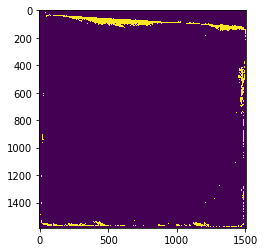

[16 11 12]


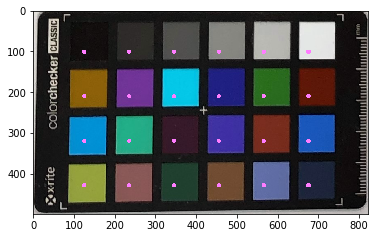

./corbana/Photo Aug 29, 10 18 16 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


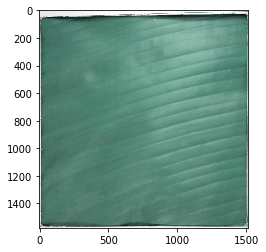

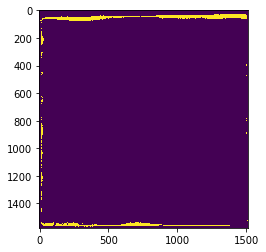

[249 255 254]


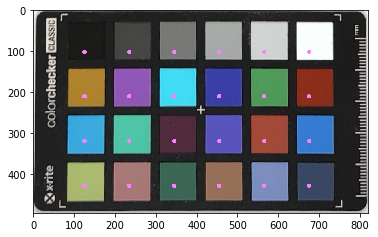

./corbana/Photo Aug 29, 10 18 26 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


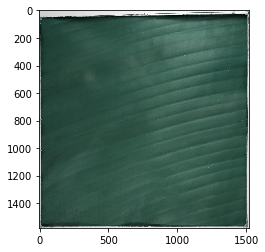

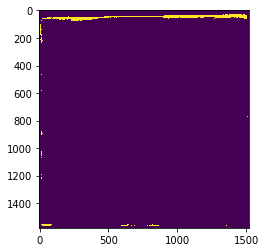

[237 242 241]


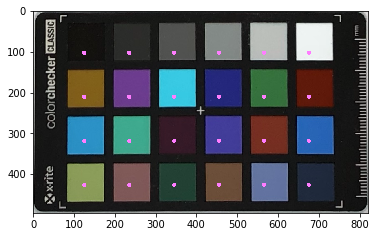

./corbana/Photo Aug 29, 10 18 36 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


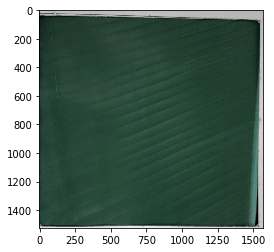

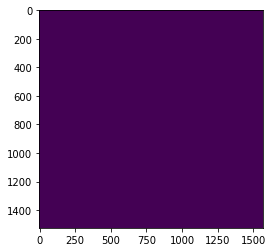

[18 19 17]


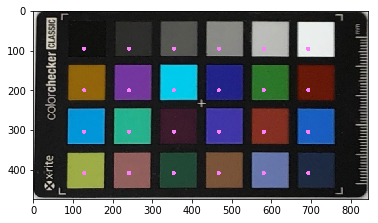

./corbana/Photo Aug 29, 10 19 00 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


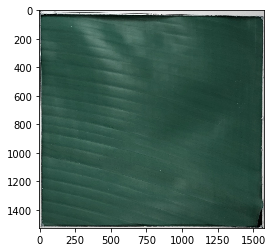

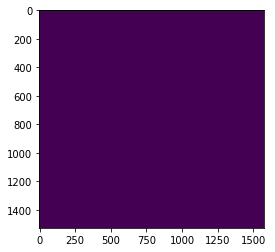

[15 16 14]


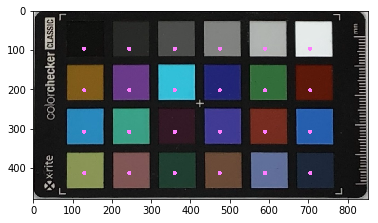

./corbana/Photo Aug 29, 10 19 48 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


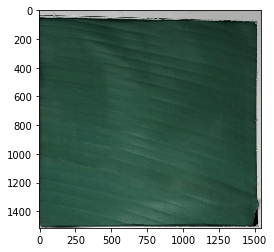

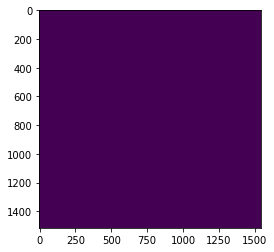

[20 21 19]


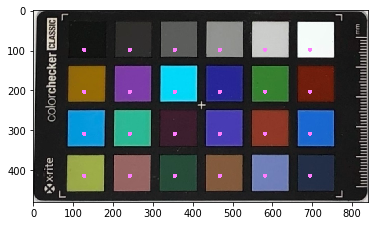

./corbana/Photo Aug 29, 10 20 50 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


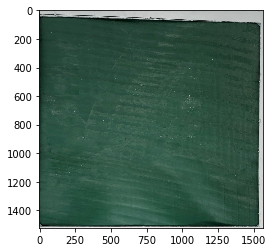

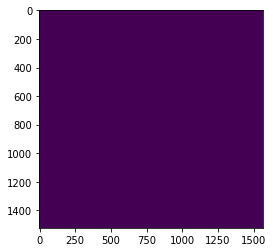

[2 3 1]


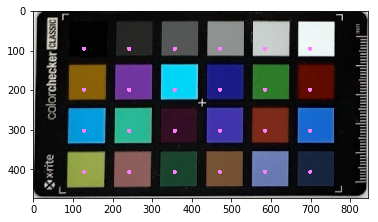

./corbana/Photo Aug 29, 10 20 55 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


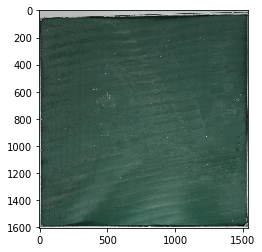

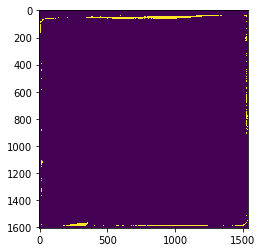

[244 252 251]


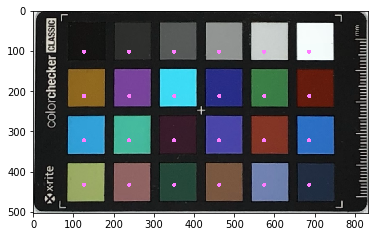

./corbana/Photo Aug 29, 10 21 22 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


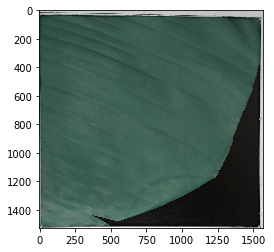

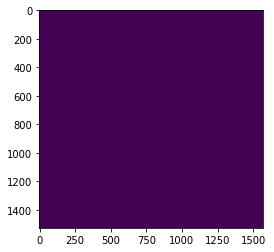

[37 33 32]


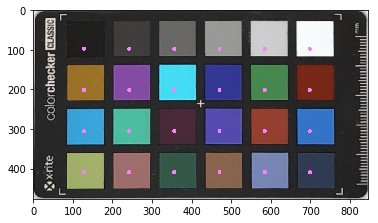

./corbana/Photo Aug 29, 10 21 28 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


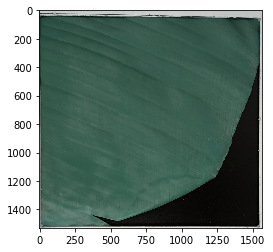

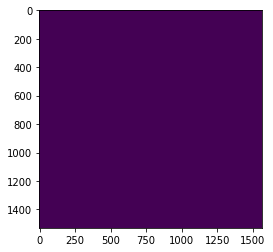

[27 25 24]


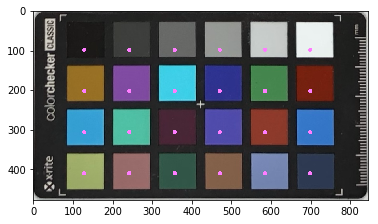

./corbana/Photo Aug 29, 10 23 16 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


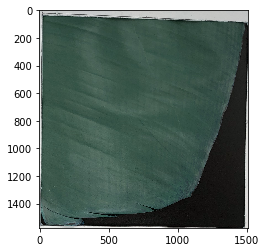

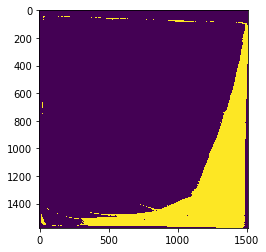

[38 36 35]


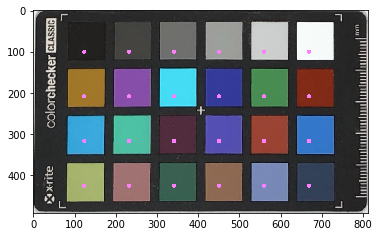

./corbana/Photo Aug 29, 10 23 20 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


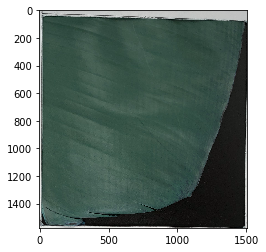

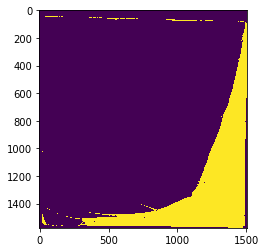

[34 32 31]


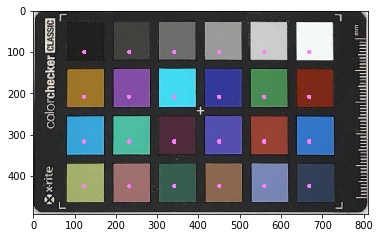

./corbana/Photo Aug 29, 10 23 24 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


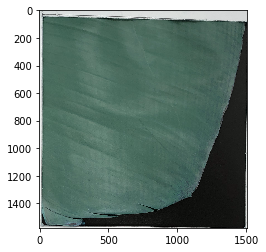

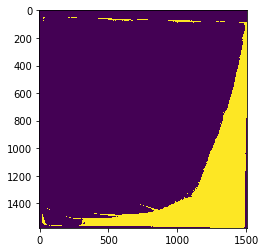

[33 34 32]


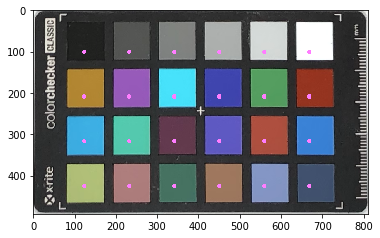

./corbana/Photo Aug 29, 10 24 13 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


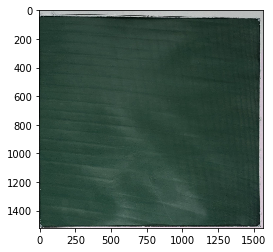

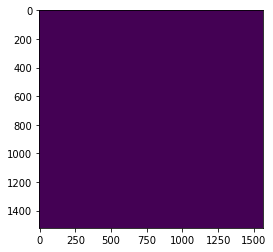

[23 21 20]


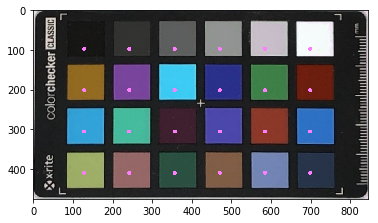

./corbana/Photo Aug 29, 10 24 17 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


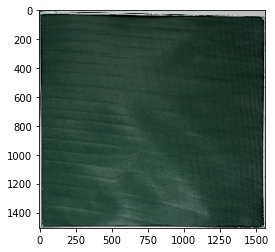

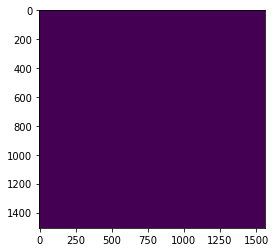

[7 5 4]


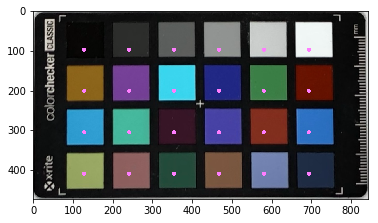

./corbana/Photo Aug 29, 10 24 20 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


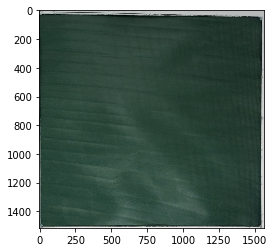

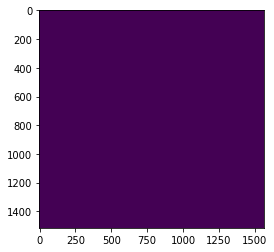

[22 23 21]


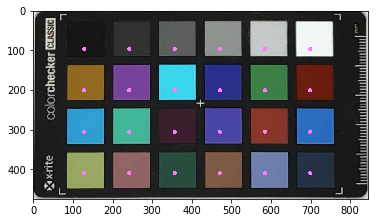

./corbana/Photo Aug 29, 10 25 22 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


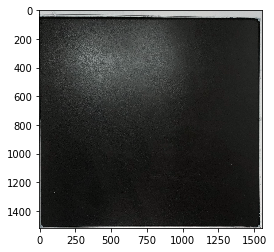

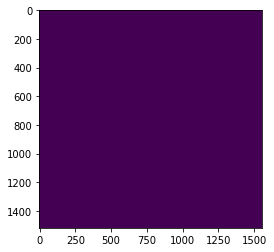

[37 35 34]


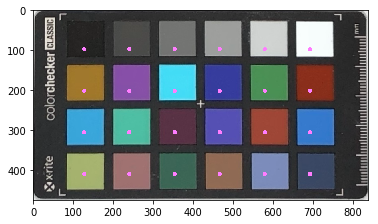

./corbana/Photo Aug 29, 10 25 26 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


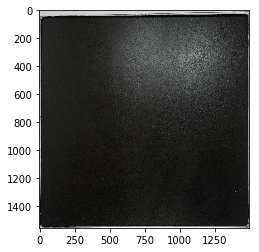

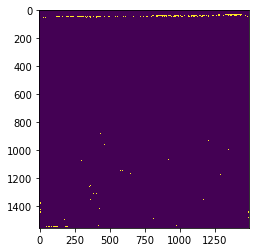

[250 255 254]


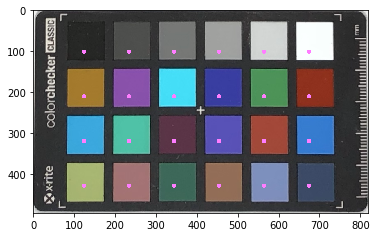

./corbana/Photo Aug 29, 10 25 33 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


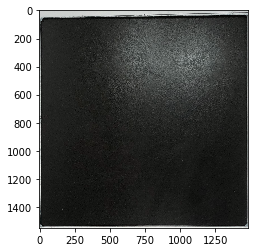

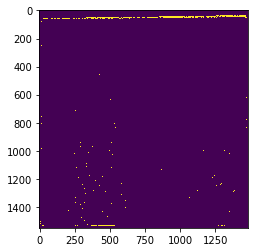

[250 255 254]


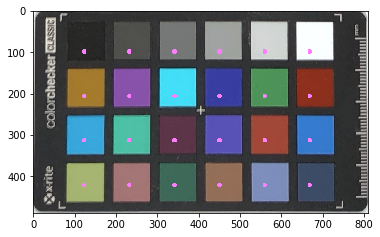

./corbana/Photo Aug 29, 10 31 10 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


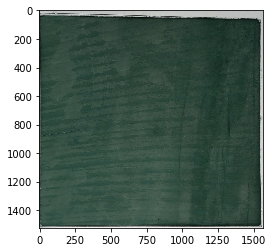

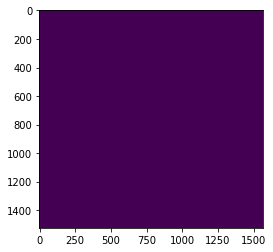

[22 23 21]


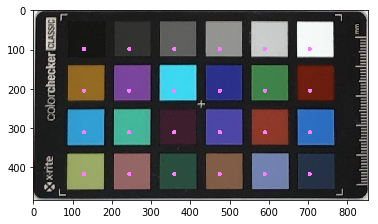

./corbana/Photo Aug 29, 10 31 14 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


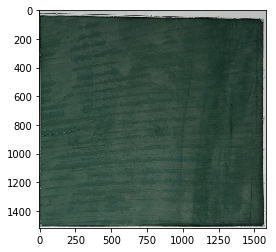

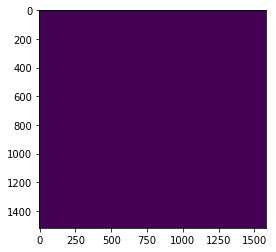

[22 23 21]


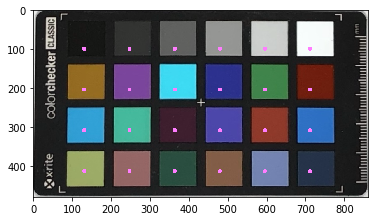

./corbana/Photo Aug 29, 10 31 18 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


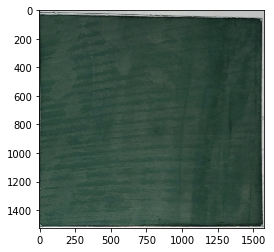

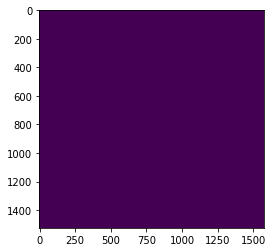

[26 27 25]


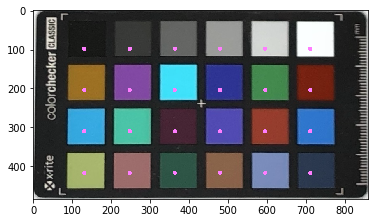

./corbana/Photo Aug 29, 10 31 26 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


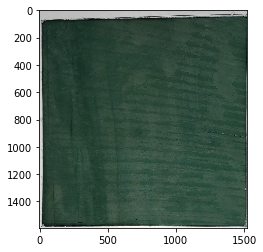

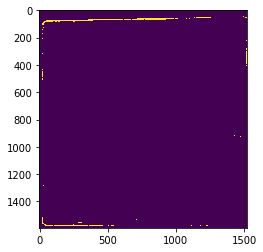

[243 250 247]


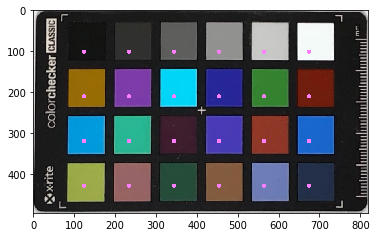

./corbana/Photo Aug 29, 10 33 14 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


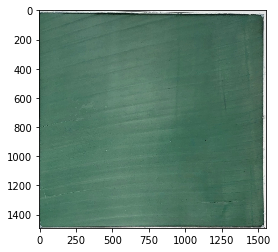

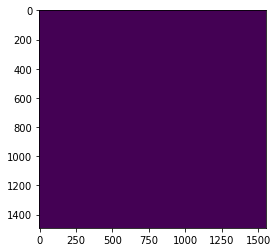

[36 37 35]


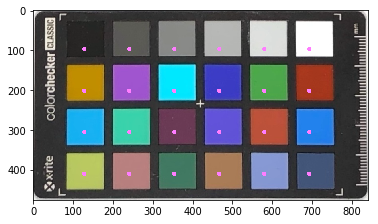

./corbana/Photo Aug 29, 10 33 17 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


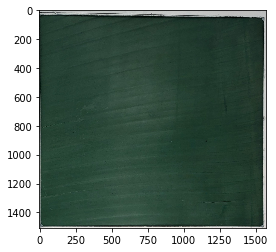

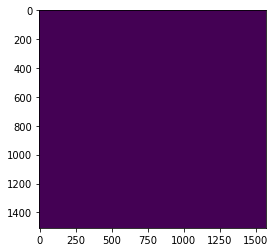

[21 19 19]


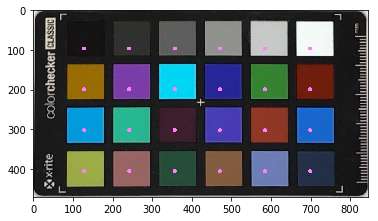

./corbana/Photo Aug 29, 10 33 21 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


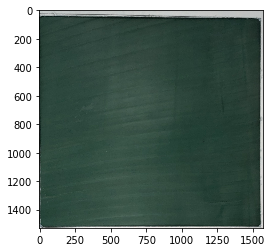

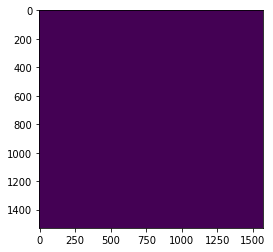

[23 21 20]


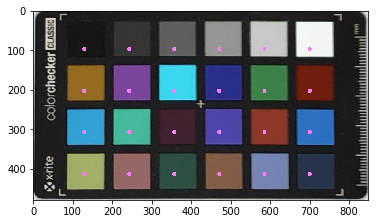

./corbana/Photo Aug 29, 10 33 24 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


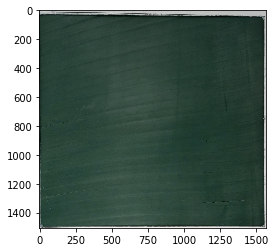

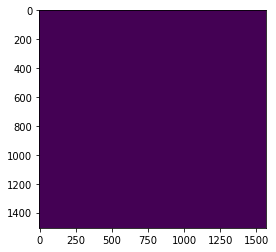

[25 23 22]


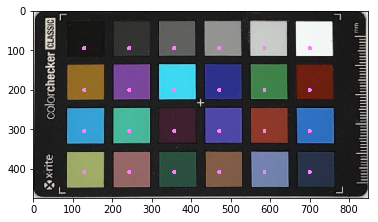

./corbana/Photo Aug 29, 10 33 27 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


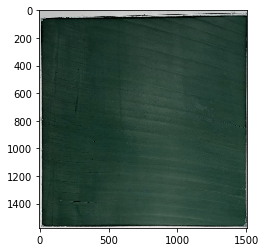

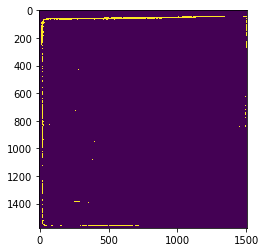

[244 246 246]


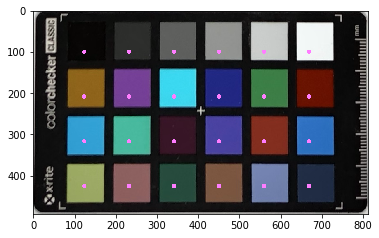

./corbana/Photo Aug 29, 10 35 58 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


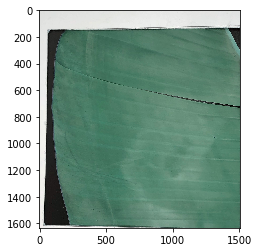

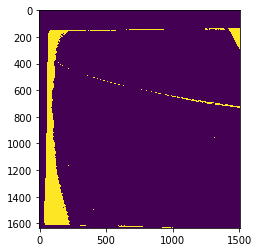

[255 255 255]


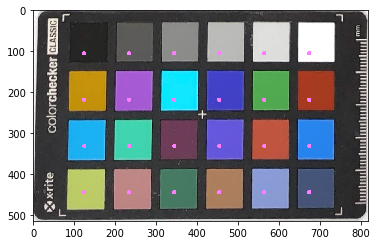

./corbana/Photo Aug 29, 10 36 01 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


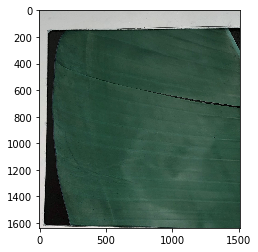

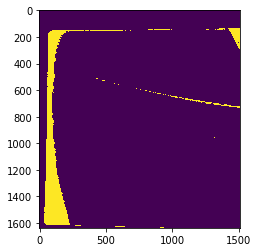

[243 250 247]


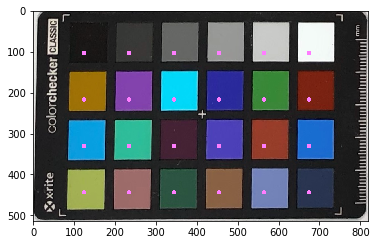

./corbana/Photo Aug 29, 10 36 08 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


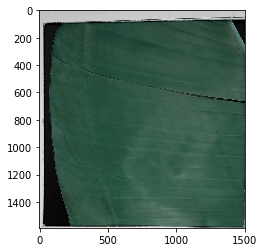

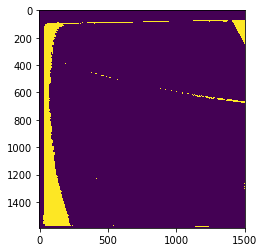

[241 243 243]


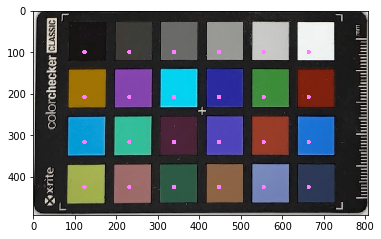

./corbana/Photo Aug 29, 10 36 11 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


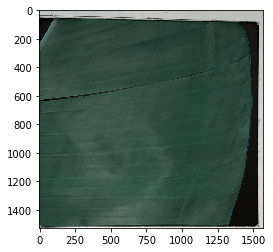

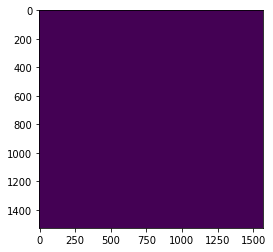

[21 22 20]


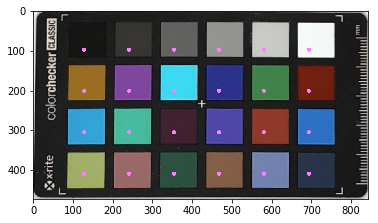

./corbana/Photo Aug 29, 10 36 32 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


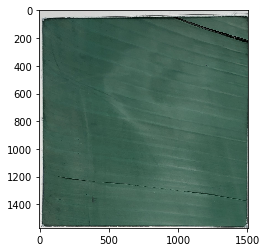

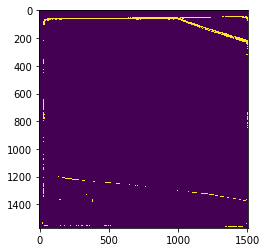

[255 255 255]


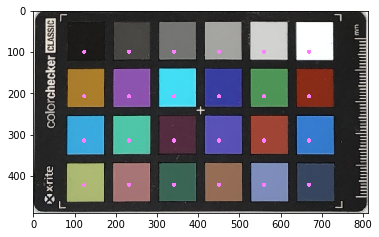

./corbana/Photo Aug 29, 10 36 34 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


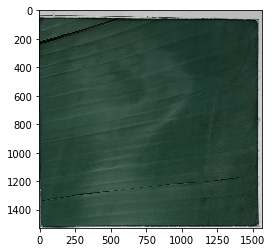

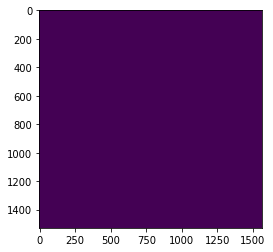

[18 19 17]


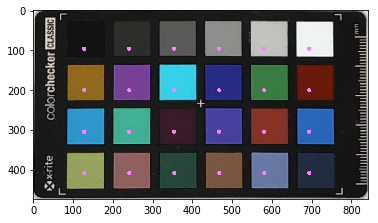

./corbana/Photo Aug 29, 10 36 36 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


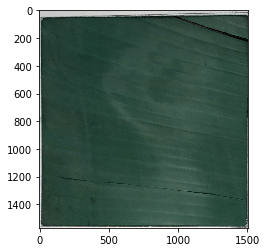

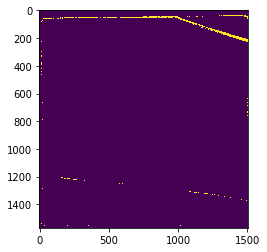

[247 252 251]


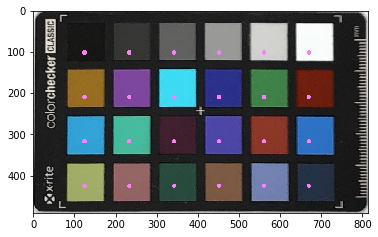

./corbana/Photo Aug 29, 10 36 38 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


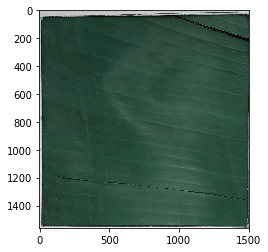

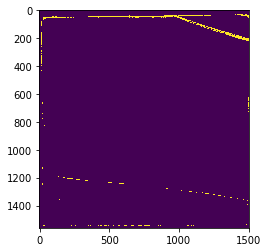

[244 251 248]


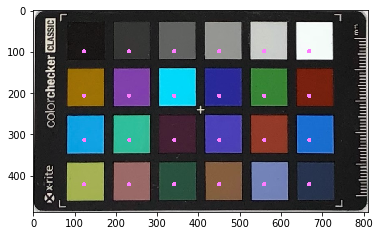

./corbana/Photo Aug 29, 10 36 41 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


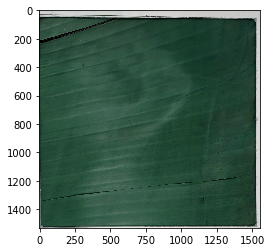

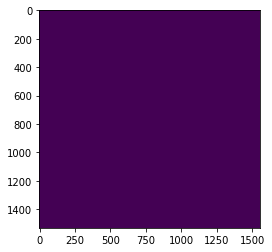

[7 8 6]


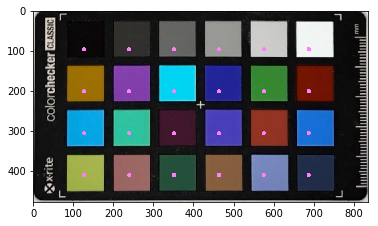

./corbana/Photo Aug 29, 10 36 43 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


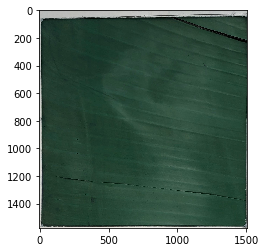

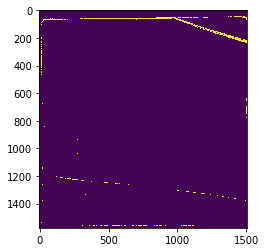

[239 245 240]


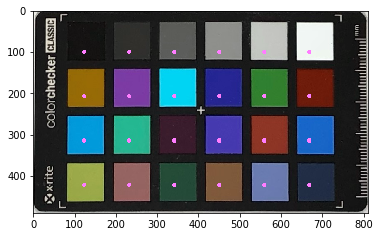

./corbana/Photo Aug 29, 10 36 45 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


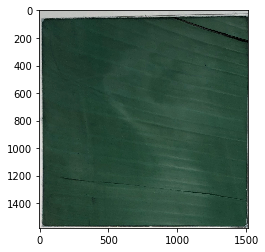

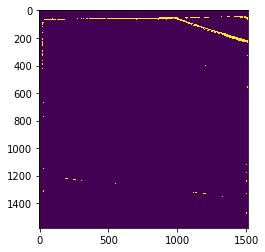

[240 247 244]


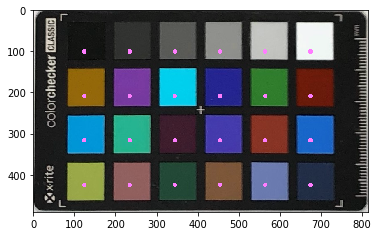

./corbana/Photo Aug 29, 10 38 04 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


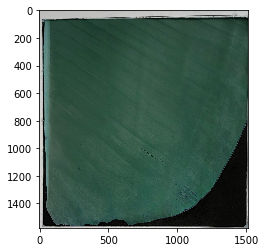

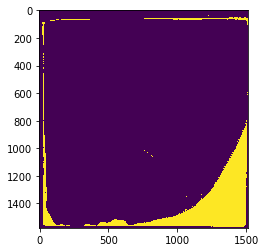

[234 236 237]


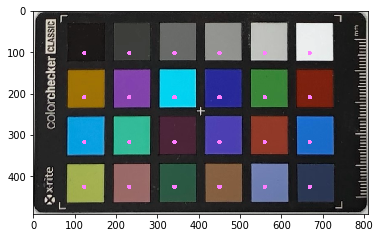

./corbana/Photo Aug 29, 10 38 06 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


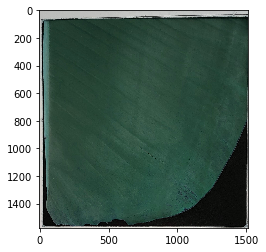

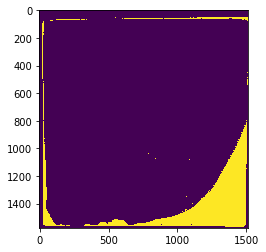

[236 243 240]


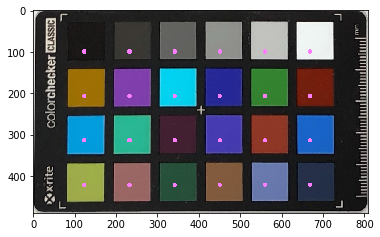

./corbana/Photo Aug 29, 10 38 08 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


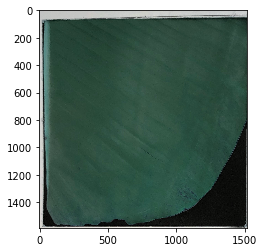

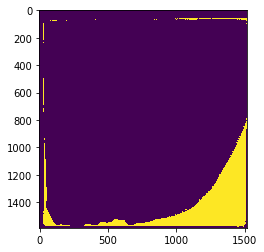

[242 249 246]


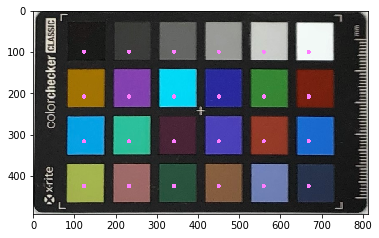

./corbana/Photo Aug 29, 10 38 13 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


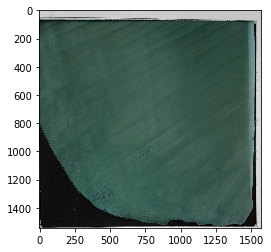

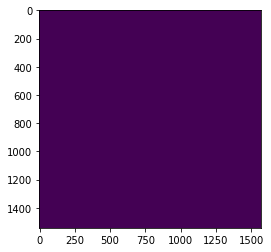

[27 28 26]


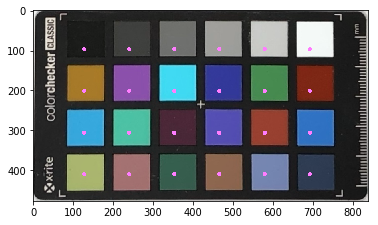

./corbana/Photo Aug 29, 10 38 15 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


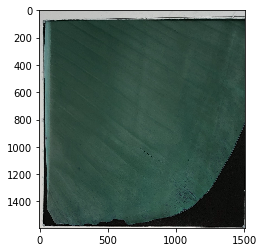

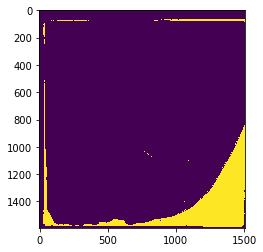

[242 247 246]


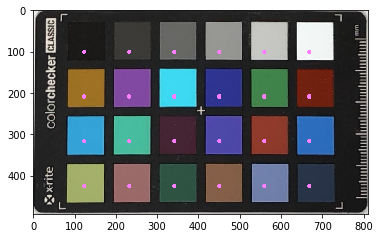

./corbana/Photo Aug 29, 10 38 17 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


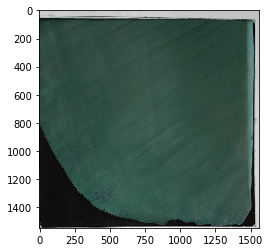

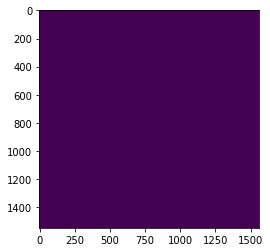

[26 27 25]


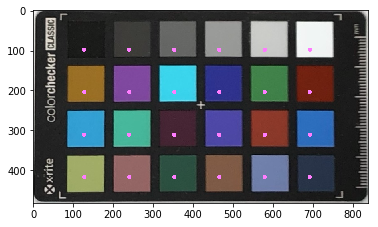

./corbana/Photo Aug 29, 10 39 08 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


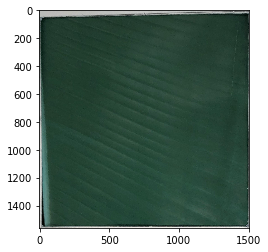

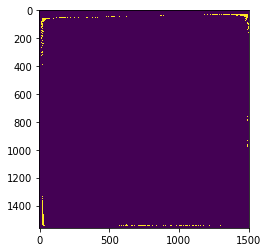

[237 242 240]


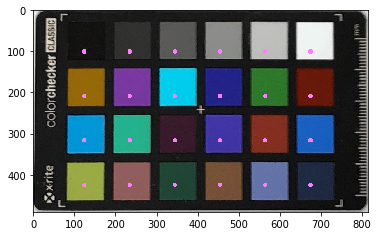

./corbana/Photo Aug 29, 10 39 11 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


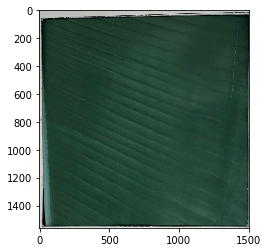

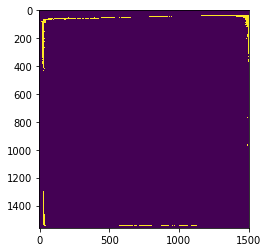

[233 236 234]


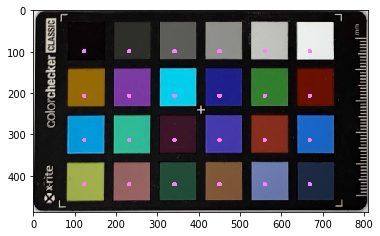

./corbana/Photo Aug 29, 10 39 13 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


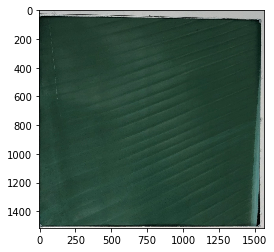

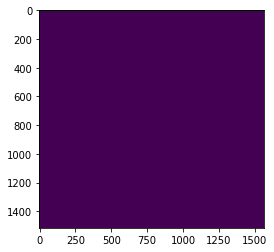

[19 22 20]


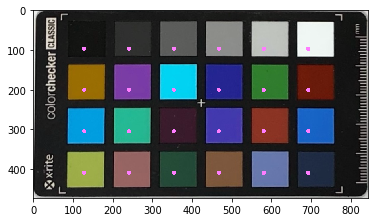

./corbana/Photo Aug 29, 10 39 19 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


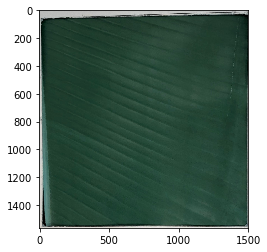

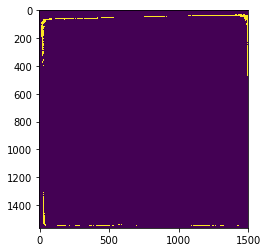

[236 238 238]


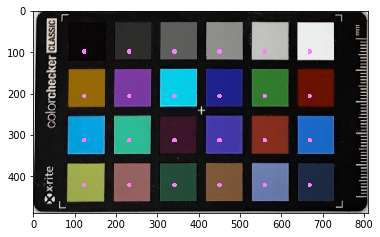

./corbana/Photo Aug 29, 10 39 21 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


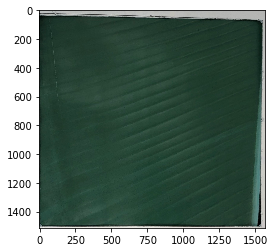

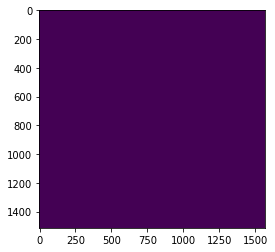

[17 18 16]


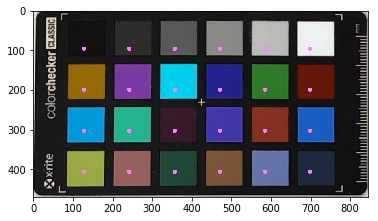

./corbana/Photo Aug 29, 10 39 24 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


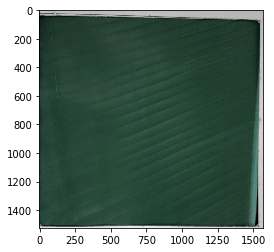

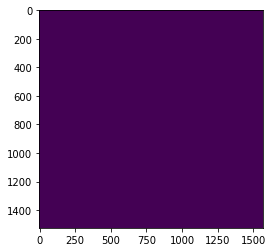

[18 19 17]


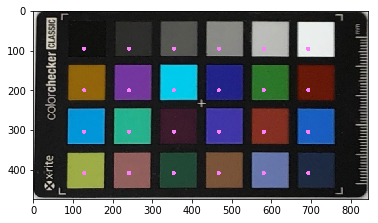

./corbana/Photo Aug 29, 10 39 26 AM.jpg
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


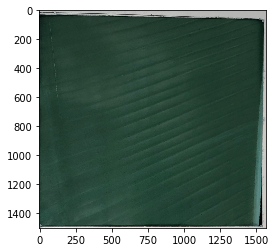

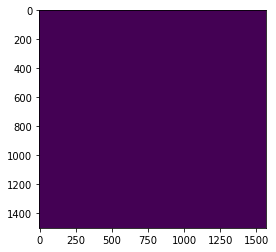

[20 18 18]


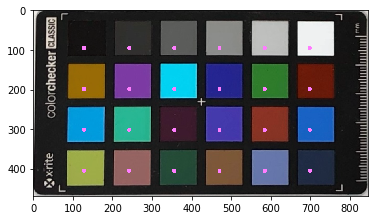

In [80]:
all_files_rgb_values = []
for file_ in all_files:
    print(file_)
    all_files_rgb_values.append(get_image_rgb_values(file_))

### Run the code till

### Apply Color Correction 

In [297]:
def color_correct(x,  file_path):
    
    red_reg = LinearRegression()
    y = np.array(list(map(lambda x1: x1[2], all_files_rgb_values[0])))
    red_reg.fit(x,y)
    
    green_reg = LinearRegression()
    y = np.array(list(map(lambda x1: x1[1], all_files_rgb_values[0])))
    green_reg.fit(x,y)
    
    blue_reg = LinearRegression()
    y = np.array(list(map(lambda x1: x1[0], all_files_rgb_values[0])))
    blue_reg.fit(x,y)

    img = cv2.imread(file_path)
    
    reshaped_img = np.reshape(img, (-1,3))
    reshaped_img = list(map(lambda x: list(x)+ [(x[0])**2, x[1]**2, x[2]**2, 
                                             x[0]**3, x[1]**3, x[2]**3,
                                            x[0]*x[1], x[1]*x[2],
                                             x[2]*x[0]], reshaped_img))
    
    b = blue_reg.predict(reshaped_img)
    g = green_reg.predict(reshaped_img)
    r = red_reg.predict(reshaped_img)
    
    comined_result  = np.zeros((b.shape[0],3))
    comined_result[:, 0] = [int(i) for i in b]
    comined_result[:, 1] = [int(i) for i in g]
    comined_result[:, 2] = [int(i) for i in r]
    
    output = np.reshape(comined_result, (img.shape[0],img.shape[1],3))
    output = np.asarray(output, np.int32)
    cv2.imwrite("outputs/"+file_path.split("/")[-1],output)
    plt.imshow(output)
    plt.show()
    
    

/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: overflow encountered in ubyte_scalars
/usr/local/lib/python3.5/dist-packages/ipykernel_launcher.py:21: RuntimeWarning: overflow encountered in ubyte_scalars
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


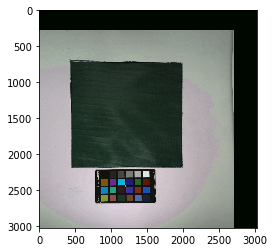

In [ ]:
for rgb_values, file_path in list(zip(all_files_rgb_values,  all_files))[15:]:
    color_correct(rgb_values, file_path)

### Detect Severity Level 